## 全球经济主题类新闻中的国家共现关系
---
> Author: 罗晨

> 数据来自[GDELT 2.0 Global Knowledge Graph](http://data.gdeltproject.org/gdeltv2/masterfilelist.txt), 说明文档见[Documentation](http://data.gdeltproject.org/documentation/GDELT-Global_Knowledge_Graph_Codebook-V2.1.pdf)

> 数据每15分钟更新一次，数据下载路径形如：<br>
> `http://data.gdeltproject.org/gdeltv2/20150218230000.gkg.csv.zip`<br>
> 其中的`20150218230000`在下一次更新会变成`20150218231500`<br>
> 注：由于GKG数据自身原因，有些下载的数据包体量太小（< 1M），说明存在错误，可以删去

> 本案例从GDELT V2 GKG中选取从 `2017年11月15日0时0分` 至 `2017年11月18日0时0分` 的新闻数据，解压后数据大小为 `9.84G` ，将新闻主题限定为“经济”(economy)，从这些经济主题类新闻中发现一带一路沿线69个国家的共现关系（国家名单来自于[中国一带一路网](https://www.yidaiyilu.gov.cn/)），输出相应的网络分析指标，并且用可视化软件 `Cytoscape` 来绘制国家间的共现关系

### 00 - 导入基本模块

In [1]:
import os
import io
import time
import random
import requests
import itertools
import numpy as np
import pandas as pd
import datetime as dt
from collections import defaultdict

### 01 - 获取数据

In [2]:
# 存放数据路径，该文件夹需要事先建立
PATH = './Nov2017/'

# gkg网络路径前缀、后缀
URL = 'http://data.gdeltproject.org/gdeltv2/'
suffix = '.gkg.csv.zip'

In [3]:
# 设置获取gkg数据的起止时间
start_date = dt.datetime(2017, 11, 15)
end_date = dt.datetime(2017, 11, 18)

print start_date, '\n', end_date
print start_date.strftime('%Y%m%d%H%M%S')

2017-11-15 00:00:00 
2017-11-18 00:00:00
20171115000000


In [4]:
# 下载数据
date = start_date

while date <= end_date:
    filename = date.strftime('%Y%m%d%H%M%S') + suffix
    try:
        req = requests.get(URL + filename)
        dl = io.open(PATH + filename, 'wb')
        for chunk in req.iter_content(chunk_size = 1024):
            if chunk:
                dl.write(chunk)
        dl.close()
        print 'downloaded...', '\t', URL + filename
    except:
        pass
    date += dt.timedelta(minutes = 15)
    # 善意请求，务必加上等待时间
    time.sleep(random.randint(10, 25))

downloaded... 	http://data.gdeltproject.org/gdeltv2/20171115000000.gkg.csv.zip
downloaded... 	http://data.gdeltproject.org/gdeltv2/20171115001500.gkg.csv.zip
downloaded... 	http://data.gdeltproject.org/gdeltv2/20171115003000.gkg.csv.zip
downloaded... 	http://data.gdeltproject.org/gdeltv2/20171115004500.gkg.csv.zip
downloaded... 	http://data.gdeltproject.org/gdeltv2/20171115010000.gkg.csv.zip
downloaded... 	http://data.gdeltproject.org/gdeltv2/20171115011500.gkg.csv.zip
downloaded... 	http://data.gdeltproject.org/gdeltv2/20171115013000.gkg.csv.zip
downloaded... 	http://data.gdeltproject.org/gdeltv2/20171115014500.gkg.csv.zip
downloaded... 	http://data.gdeltproject.org/gdeltv2/20171115020000.gkg.csv.zip
downloaded... 	http://data.gdeltproject.org/gdeltv2/20171115024500.gkg.csv.zip
downloaded... 	http://data.gdeltproject.org/gdeltv2/20171115030000.gkg.csv.zip
downloaded... 	http://data.gdeltproject.org/gdeltv2/20171115031500.gkg.csv.zip
downloaded... 	http://data.gdeltproject.org/gdeltv2/

### 02 - 数据格式

In [4]:
# 数据不包含字段名称，数据含义详细解释请查看说明文档
with open(PATH + '20171115000000.gkg.csv', 'r') as f:
    header = f.readline()
    print header.split('\t')

['20171115000000-0', '20171115000000', '2', 'BBC Monitoring', 'BBC Monitoring in Russian /BBC Monitoring/(c) BBC', '', '', 'TAX_WORLDLANGUAGES;TAX_WORLDLANGUAGES_RUSSIA;TAX_WORLDLANGUAGES_RUSSIAN;TAX_FNCACT;TAX_FNCACT_AGENT;TAX_FNCACT_MINISTER;LEADER;', 'TAX_WORLDLANGUAGES_RUSSIA,6;TAX_WORLDLANGUAGES_RUSSIA,230;TAX_WORLDLANGUAGES_RUSSIA,424;TAX_WORLDLANGUAGES_RUSSIA,527;TAX_WORLDLANGUAGES_RUSSIA,654;TAX_WORLDLANGUAGES_RUSSIA,733;TAX_WORLDLANGUAGES_RUSSIA,795;TAX_WORLDLANGUAGES_RUSSIA,1358;TAX_WORLDLANGUAGES_RUSSIA,1962;TAX_WORLDLANGUAGES_RUSSIA,2576;TAX_WORLDLANGUAGES_RUSSIA,2737;TAX_WORLDLANGUAGES_RUSSIA,2852;TAX_WORLDLANGUAGES_RUSSIA,2990;TAX_WORLDLANGUAGES_RUSSIA,3063;TAX_WORLDLANGUAGES_RUSSIA,3275;TAX_WORLDLANGUAGES_RUSSIA,3588;TAX_WORLDLANGUAGES_RUSSIA,3798;TAX_WORLDLANGUAGES_RUSSIA,4446;TAX_WORLDLANGUAGES_RUSSIA,4940;TAX_WORLDLANGUAGES_RUSSIA,4971;TAX_WORLDLANGUAGES_RUSSIA,5279;TAX_WORLDLANGUAGES_RUSSIAN,53;TAX_WORLDLANGUAGES_RUSSIAN,280;TAX_WORLDLANGUAGES_RUSSIAN,1614;TAX_WORLDL

In [5]:
# 查看Locations，在第10列
# 用;分隔的#连接字符，连接成分包括：
# Location Type（整数）：1-Country, 2-USSTATE, 3-USCITY, 4-WorldCity（美国以外的城市）,5-WorldState（美国以外的与州对等的区划）
# 对于1、2、5提供几何中心的经纬度，本处只选取Country层面进行分析
# Location FullName（文本）：详细的地名，格式包括："State, Country"(for 2, 5), "City/Landmark, State, Country"(for 1, 3, 4)
# Location CountryCode（文本）：FIPS10-4国家代码，长度为2
# and so on
with open(PATH + '20171115000000.gkg.csv', 'r') as f:
    print f.readlines()[0].split('\t')[9].split(';')

['4#Moscow, Moskva, Russia#RS#RS48#55.7522#37.6156#-2960561', '4#Raqqa, Ar Raqqah, Syria#SY#SY04#35.95#39.0167#-2538949', '1#United States#US#US#39.828175#-98.5795#US', '1#United Kingdom#UK#UK#54#-4#UK', '1#Iran#IR#IR#32#53#IR', "4#Kaliningrad, Kaliningradskaya Oblast', Russia#RS#RS23#54.7065#20.511#-2918852", "4#Rossiya, Orenburgskaya Oblast', Russia#RS#RS55#52.4#54.9833#-2993111", '1#North Korea#KN#KN#40#127#KN', '1#Syria#SY#SY#35#38#SY', '1#Russia#RS#RS#60#100#RS', '4#Abu Kamal, Dayr Az Zawr, Syria#SY#SY07#34.45#40.9186#-2537443', '4#London, London, City Of, United Kingdom#UK#UKH9#51.5#-0.116667#-2601889']


In [6]:
# 查看主题，在第8列
with open(PATH + '20171115000000.gkg.csv', 'r') as f:
    print f.readlines()[0].split('\t')[7].split(';')

['TAX_WORLDLANGUAGES', 'TAX_WORLDLANGUAGES_RUSSIA', 'TAX_WORLDLANGUAGES_RUSSIAN', 'TAX_FNCACT', 'TAX_FNCACT_AGENT', 'TAX_FNCACT_MINISTER', 'LEADER', '']


### 03 - 查找所有文件中包含“经济”主题且涉及“中国”的新闻

In [7]:
csvnames = os.listdir('./Nov2017')
len(csvnames)

254

In [8]:
%%time
# 如果不加限定条件的话，存在的共现关系过多，因此对主题(themes)加以限定，选择的与经济相关的主题，特征是以"ECON"开头
includeCHN = open('includeCHN.txt', 'w')
_ = []

# 包含“经济”主题的新闻数：273,109
for csv in csvnames:
    with open(PATH + csv, 'r') as f:
        for line in f.readlines():
            try:
                themeField = line.split('\t')[7]
                if 'ECON' in themeField:
                    _.append(line.strip())
            except:
                pass
print len(_)

# 包含“经济”主题且涉及中国的新闻数：22,119
for news in set(_):
    try:
        locationField = news.split('\t')[9]
        if "china" in locationField.lower():
            includeCHN.write(locationField)
            includeCHN.write('\n')
    except:
        pass

includeCHN.close()

with open('includeCHN.txt', 'r') as f:
    print len(f.readlines())

273109
22119


### 04 - 查找与中国共现的国家 & 这些国家间存在的共现关系

In [9]:
states = []

with open('includeCHN.txt', 'r') as f:
    for line in f.readlines():
        lst = []
        locations = line.split(';')
        for location in locations:
            # 只选择国家，country code = 1
            if location.split('#')[0] == '1':
                lst.append(location.split('#')[1].strip())
        # 使用集合，因为国家名称有可能重复
        lst = list(set(lst))       
        # 需要按照首字母顺序进行排序，避免后续出现组合重复
        lst.sort()
        states.append(lst)

In [10]:
# 检查国家名称是否与一带一路国家英文名称（存放在BRStates.xlsx中）相一致
# 如果存在不一致，需要修改BRStates.xlsx，如：Vietnam: Vietnam, Republic Of | Korea: South Korea
states[0:20]

[['Bangladesh',
  'China',
  'Czech Republic',
  'Italy',
  'Kuwait',
  'Pakistan',
  'Saudi Arabia',
  'Sri Lanka',
  'Thailand',
  'Uzbekistan'],
 ['Cambodia', 'China', 'United States', 'Vietnam, Republic Of'],
 ['Canada'],
 ['China'],
 ['China',
  'Germany',
  'Philippines',
  'Saudi Arabia',
  'South Korea',
  'Vietnam, Republic Of'],
 ['Canada', 'Chile', 'China', 'France', 'Germany', 'Mexico'],
 ['China', 'France', 'United Kingdom', 'United States'],
 ['Australia', 'Japan'],
 ['Canada', 'China', 'Hong Kong', 'United Kingdom'],
 ['China', 'South Korea'],
 ['Australia', 'China', 'Japan', 'South Africa', 'United States'],
 ['China'],
 ['China', 'Philippines'],
 ['Australia',
  'China',
  'India',
  'Singapore',
  'Switzerland',
  'United Kingdom',
  'United States'],
 ['Antarctica', 'China', 'Germany', 'Russia', 'United States'],
 ['Argentina',
  'Brazil',
  'China',
  'Germany',
  'India',
  'Japan',
  'Mexico',
  'Russia',
  'Saudi Arabia',
  'Tunisia',
  'United Kingdom',
  'Unite

In [11]:
states[:3]

[['Bangladesh',
  'China',
  'Czech Republic',
  'Italy',
  'Kuwait',
  'Pakistan',
  'Saudi Arabia',
  'Sri Lanka',
  'Thailand',
  'Uzbekistan'],
 ['Cambodia', 'China', 'United States', 'Vietnam, Republic Of'],
 ['Canada']]

In [12]:
# 构建国家之间的组合
statePairwise = []
for i in states:
    statePairwise.append(list(itertools.combinations(i, 2)))
# peek，如果列表为空表示对应事件中仅仅出现了一个国家
statePairwise[:3]

[[('Bangladesh', 'China'),
  ('Bangladesh', 'Czech Republic'),
  ('Bangladesh', 'Italy'),
  ('Bangladesh', 'Kuwait'),
  ('Bangladesh', 'Pakistan'),
  ('Bangladesh', 'Saudi Arabia'),
  ('Bangladesh', 'Sri Lanka'),
  ('Bangladesh', 'Thailand'),
  ('Bangladesh', 'Uzbekistan'),
  ('China', 'Czech Republic'),
  ('China', 'Italy'),
  ('China', 'Kuwait'),
  ('China', 'Pakistan'),
  ('China', 'Saudi Arabia'),
  ('China', 'Sri Lanka'),
  ('China', 'Thailand'),
  ('China', 'Uzbekistan'),
  ('Czech Republic', 'Italy'),
  ('Czech Republic', 'Kuwait'),
  ('Czech Republic', 'Pakistan'),
  ('Czech Republic', 'Saudi Arabia'),
  ('Czech Republic', 'Sri Lanka'),
  ('Czech Republic', 'Thailand'),
  ('Czech Republic', 'Uzbekistan'),
  ('Italy', 'Kuwait'),
  ('Italy', 'Pakistan'),
  ('Italy', 'Saudi Arabia'),
  ('Italy', 'Sri Lanka'),
  ('Italy', 'Thailand'),
  ('Italy', 'Uzbekistan'),
  ('Kuwait', 'Pakistan'),
  ('Kuwait', 'Saudi Arabia'),
  ('Kuwait', 'Sri Lanka'),
  ('Kuwait', 'Thailand'),
  ('Kuwait', 

In [13]:
# 计算国家间共现次数
pairCount = defaultdict(int)

for i in statePairwise:
    if len(i) > 0:
        for j in i:
            pairCount[j] += 1
# 共存在15,012对国家共现关系
len(pairCount)

15012

### 05 - 筛选出共现国家中的一带一路沿线国家

In [14]:
BRStates = pd.read_excel('BRStates.xlsx', 
                         sheetname='Sheet1', 
                         header=0)
BRStates.head()

,国家,Country
0,阿富汗,Afghanistan
1,阿尔巴尼亚,Albania
2,亚美尼亚,Armenia
3,阿塞拜疆,Azerbaijan
4,巴林,Bahrain


In [15]:
BRCountry = [i.lower() for i in list(BRStates['Country'])]
len(BRCountry)

69

In [16]:
# 一带一路的国家间存在1,893对共现关系
for i in pairCount.items():
    if i[0][0].lower() not in BRCountry or i[0][1].lower() not in BRCountry:
        pairCount.pop(i[0])
len(pairCount)

1893

### 06 - 绘制网络

In [17]:
network = []
# 由于关系过多，绘制的网络图不清晰，选择共现数量超过50次的国家
for i in sorted(pairCount.items(), key = lambda x: x[1], reverse = True):
    network.append({'source': i[0][0], 'target': i[0][1], 'value': i[1]})
network = pd.DataFrame(network)
network = network[network['value'] >= 50]
network.head()

,source,target,value
0,China,India,3729
1,China,Russia,3497
2,China,South Korea,2561
3,China,"Vietnam, Republic Of",2118
4,China,Philippines,1825


In [18]:
# 导出数据，使用Cytoscape绘图
network.to_excel('statesco.xlsx', 
                 sheet_name='Sheet1',
                 header=True, 
                 index=False)

In [19]:
# 大致图形如下，原图请见附件
from IPython.display import Image

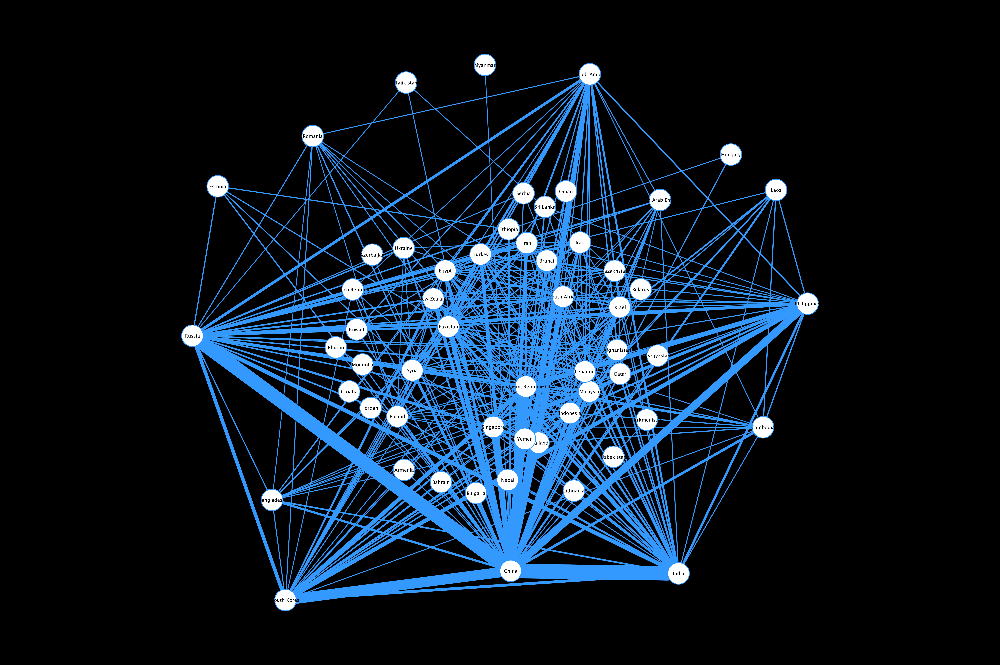

In [20]:
Image('co1.png', width=1000)

### 07 - 网络指标计算
- 已汇总到 `topologicalIndex.xlsx` 中

In [21]:
import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline

In [22]:
g = nx.Graph()
for r in network.values:
    g.add_edge(r[0], r[1], weight = r[2])

In [23]:
# 度 d
degree = dict(g.degree)
d = pd.DataFrame({'state': degree.keys(), 'degree': degree.values()})
d

,degree,state
0,26,Turkey
1,11,Afghanistan
2,13,Qatar
3,15,Bangladesh
4,2,Bhutan
5,4,Kuwait
6,3,Nepal
7,1,Lithuania
8,13,Cambodia
9,5,Ethiopia


In [24]:
# 度中心性 dc
degreeCentrality = dict(nx.degree_centrality(g))
dc = pd.DataFrame({'state': degreeCentrality.keys(), 'degree centrality': degreeCentrality.values()})
dc

,degree centrality,state
0,0.464286,Turkey
1,0.196429,Afghanistan
2,0.232143,Qatar
3,0.267857,Bangladesh
4,0.035714,Bhutan
5,0.071429,Kuwait
6,0.053571,Nepal
7,0.017857,Lithuania
8,0.232143,Cambodia
9,0.089286,Ethiopia


In [25]:
# 特征向量中心性 ec
eigenCentrality = dict(nx.eigenvector_centrality(g))
ec = pd.DataFrame({'state': eigenCentrality.keys(), 'eigenvector centrality': eigenCentrality.values()})
ec

,eigenvector centrality,state
0,0.206993,Turkey
1,0.105818,Afghanistan
2,0.124607,Qatar
3,0.138567,Bangladesh
4,0.022805,Bhutan
5,0.043216,Kuwait
6,0.032960,Nepal
7,0.011982,Lithuania
8,0.123438,Cambodia
9,0.042152,Ethiopia


In [26]:
# 接近中心性 c
closeness = dict(nx.closeness_centrality(g))
c = pd.DataFrame({'state': closeness.keys(), 'closeness centrality': closeness.values()})
c

,closeness centrality,state
0,0.651163,Turkey
1,0.554455,Afghanistan
2,0.565657,Qatar
3,0.577320,Bangladesh
4,0.509091,Bhutan
5,0.518519,Kuwait
6,0.513761,Nepal
7,0.504505,Lithuania
8,0.565657,Cambodia
9,0.523364,Ethiopia


In [27]:
# 中介中心性 b
betweenness = dict(nx.betweenness_centrality(g))
b = pd.DataFrame({'state': betweenness.keys(), 'betweenness centrality': betweenness.values()})
b

,betweenness centrality,state
0,0.009633,Turkey
1,0.000000,Afghanistan
2,0.000177,Qatar
3,0.000719,Bangladesh
4,0.000000,Bhutan
5,0.000000,Kuwait
6,0.000000,Nepal
7,0.000000,Lithuania
8,0.000118,Cambodia
9,0.000000,Ethiopia


In [28]:
# 拼接所有指标
d_dc = pd.merge(d, dc, on=['state'])
d_dc_ec = pd.merge(d_dc, ec, on=['state'])
d_dc_ec_c = pd.merge(d_dc_ec, c, on=['state'])
d_dc_ec_c_b = pd.merge(d_dc_ec_c, b, on = ['state'])
d_dc_ec_c_b.to_excel('topologicalIndex.xlsx', 
                     sheet_name='Sheet1', 
                     header=True, 
                     index=False)

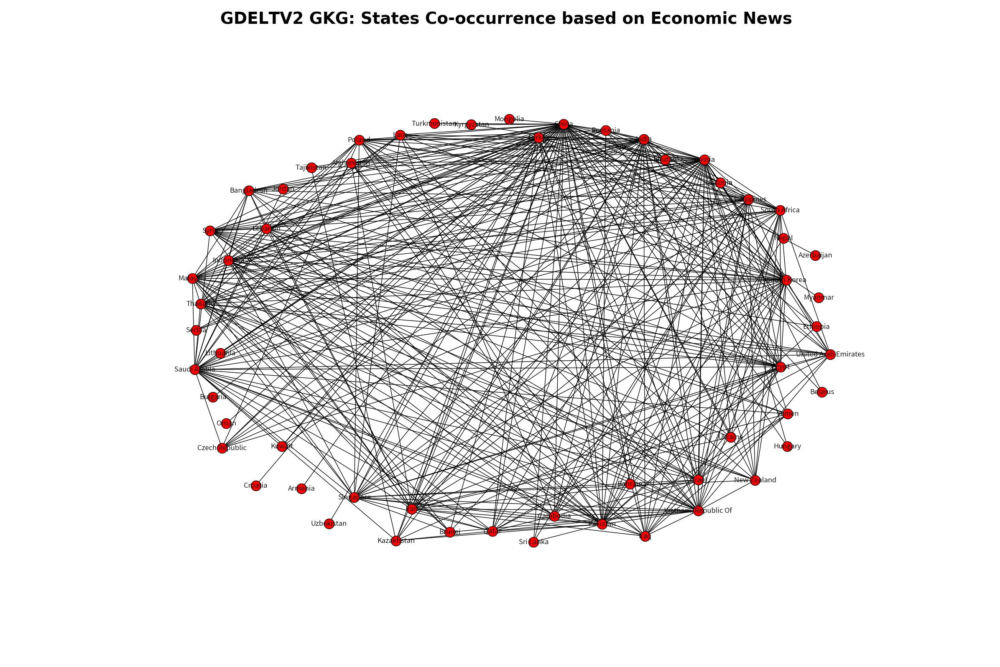

In [29]:
g = nx.Graph()
for r in network.values:
    g.add_edge(r[0], r[1], weight = r[2]/10000)
plt.figure(figsize=(30, 20))
plt.title('GDELTV2 GKG: States Co-occurrence based on Economic News', 
          y = 0.97, 
          fontsize = 28, 
          fontweight = 'bold')
nx.draw(g, with_labels=True)

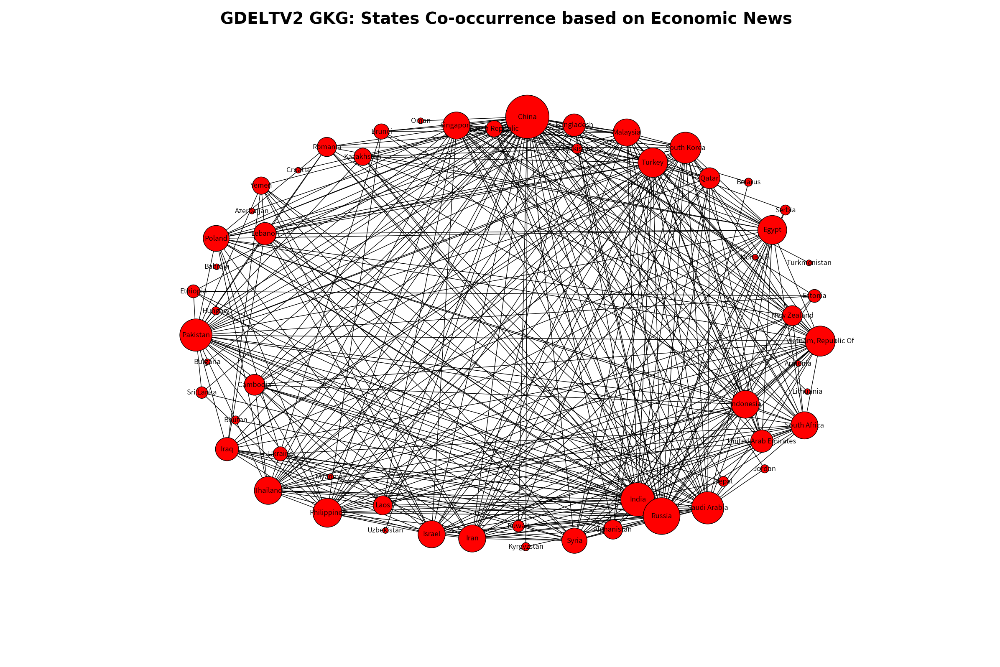

In [30]:
# 节点的大小与节点的度指标成正比
g = nx.Graph()
for r in network.values:
    g.add_edge(r[0], r[1], weight = r[2]/10000)
plt.figure(figsize=(30, 20))
plt.title('GDELTV2 GKG: States Co-occurrence based on Economic News', 
          y = 0.97, 
          fontsize = 28, 
          fontweight = 'bold')
d = dict(nx.degree(g))
nx.draw(g, nodelist = d.keys(), node_size = [v*100 for v in d.values()], with_labels = True)

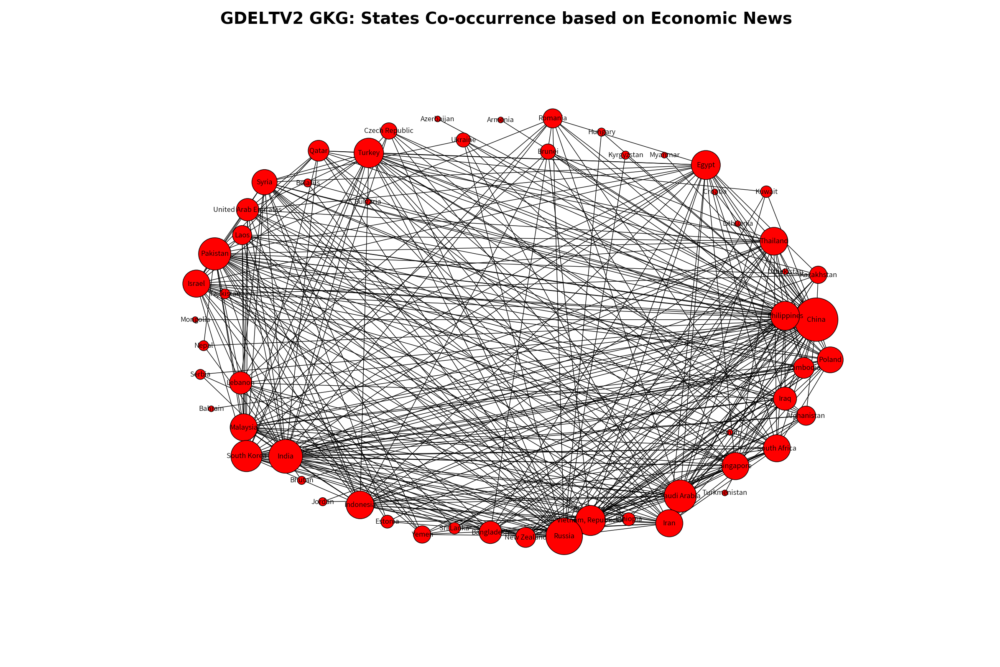

In [31]:
# 获取最大的连通子图
g = nx.Graph()
for r in network.values:
    g.add_edge(r[0], r[1], weight = r[2]/10000)
plt.figure(figsize=(30, 20))
plt.title('GDELTV2 GKG: States Co-occurrence based on Economic News', 
          y = 0.97, 
          fontsize = 28, 
          fontweight = 'bold')
gmax = max(nx.connected_component_subgraphs(g), key=len)
d = dict(nx.degree(gmax))
nx.draw(gmax, 
        nodelist=d.keys(), 
        node_size=[v * 100 for v in d.values()], 
        with_labels = True)

Degree for each node:  
Turkey 	26
Afghanistan 	11
Qatar 	13
Bangladesh 	15
Bhutan 	2
Kuwait 	4
Nepal 	3
Lithuania 	1
Cambodia 	13
Ethiopia 	5
Laos 	11
Czech Republic 	8
Bahrain 	1
Brunei 	7
Saudi Arabia 	31
Belarus 	2
Iran 	22
Singapore 	22
Jordan 	2
Armenia 	1
China 	56
Vietnam, Republic Of 	27
Kazakhstan 	9
Philippines 	25
Ukraine 	6
India 	34
Kyrgyzstan 	2
Oman 	1
Poland 	20
Indonesia 	23
Israel 	22
Tajikistan 	3
Serbia 	3
Croatia 	1
Mongolia 	1
Thailand 	23
Syria 	19
New Zealand 	12
Yemen 	9
Russia 	40
Bulgaria 	1
Pakistan 	31
Romania 	11
Iraq 	16
Estonia 	5
Myanmar 	1
South Africa 	22
Egypt 	25
United Arab Emirates 	15
Lebanon 	15
Azerbaijan 	1
Uzbekistan 	1
Malaysia 	22
Sri Lanka 	4
Hungary 	2
South Korea 	29
Turkmenistan 	1



Betweenness Centrality for each node:  

Turkey 	0.00963276648867
Afghanistan 	0.0
Qatar 	0.000177114552115
Bangladesh 	0.000718996912179
Bhutan 	0.0
Kuwait 	0.0
Nepal 	0.0
Lithuania 	0.0
Cambodia 	0.000118063754427
Ethiopia 	0.0
Laos 	0.0
Czech Republic 

{'Afghanistan': <matplotlib.text.Text at 0x117674910>,
 'Armenia': <matplotlib.text.Text at 0x1176a8450>,
 'Azerbaijan': <matplotlib.text.Text at 0x117511a10>,
 'Bahrain': <matplotlib.text.Text at 0x1176997d0>,
 'Bangladesh': <matplotlib.text.Text at 0x1176811d0>,
 'Belarus': <matplotlib.text.Text at 0x116dbab50>,
 'Bhutan': <matplotlib.text.Text at 0x117681610>,
 'Brunei': <matplotlib.text.Text at 0x11818dc90>,
 'Bulgaria': <matplotlib.text.Text at 0x116feeed0>,
 'Cambodia': <matplotlib.text.Text at 0x11768e690>,
 'China': <matplotlib.text.Text at 0x1176a8890>,
 'Croatia': <matplotlib.text.Text at 0x116fe20d0>,
 'Czech Republic': <matplotlib.text.Text at 0x117699390>,
 'Egypt': <matplotlib.text.Text at 0x117504d10>,
 'Estonia': <matplotlib.text.Text at 0x117504490>,
 'Ethiopia': <matplotlib.text.Text at 0x11768ead0>,
 'Hungary': <matplotlib.text.Text at 0x1176b6e10>,
 'India': <matplotlib.text.Text at 0x1175115d0>,
 'Indonesia': <matplotlib.text.Text at 0x116fc9f50>,
 'Iran': <matplot

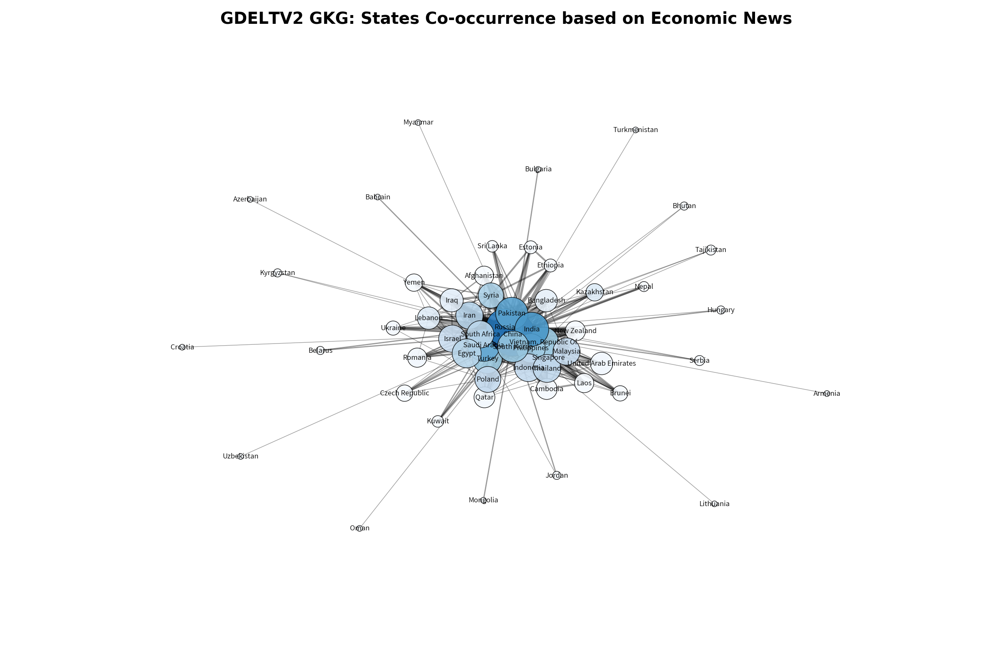

In [32]:
# 对节点、边、标签分别进行渲染
import math

g = nx.Graph()
for r in network.values:
    g.add_edge(r[0], r[1], weight=r[2]/40)

plt.figure(figsize=(30, 20))
plt.title('GDELTV2 GKG: States Co-occurrence based on Economic News', 
          y = 0.97, 
          fontsize = 28, 
          fontweight = 'bold')
cf = plt.gcf()
ax = cf.gca()
ax.set_axis_off()

gmax = max(nx.connected_component_subgraphs(g), key=len)

d = nx.degree(gmax)
d_new = list(d)
# 度指标
print 'Degree for each node: ', '\n',
for i in d_new:
    print i[0], '\t', i[1]

print '\n\n'

b = nx.betweenness_centrality(gmax).items()
b_new = list(b)
# 中介中心性指标
print 'Betweenness Centrality for each node: ', '\n'
for j in b_new:
    print j[0], '\t', j[1]

# 使用spring layout
pos = nx.spring_layout(gmax)

# 针对边的设置
nx.draw_networkx_edges(gmax, 
                       pos, 
                       nodelist=[v[0] for v in b], 
                       node_size=[d[v[0]]*100 for v in b], 
                       with_labels=False, 
                       alpha=0.4, 
                       node_color = [math.log(1+v[1]*1000) for v in b], 
                       cmap=plt.cm.Blues,
                       width=[gmax[u][v]['weight'] for u,v in gmax.edges()])

# 针对节点的设置
nx.draw_networkx_nodes(gmax, 
                       pos, 
                       nodelist=[v[0] for v in b], 
                       node_size=[d[v[0]]*100 for v in b], 
                       with_labels=True, 
                       alpha=0.9, 
                       node_color = [math.log(1+v[1]*1000) for v in b], 
                       cmap=plt.cm.Blues, 
                       width=[gmax[u][v]['weight'] for u,v in gmax.edges()])

# 针对标签的设置
nx.draw_networkx_labels(gmax, 
                        pos, 
                        nodelist=[v[0] for v in b], 
                        node_size=[d[v[0]]*100 for v in b], 
                        with_labels=True, 
                        node_color = [math.log(1+v[1]*1000) for v in b], 
                        cmap=plt.cm.Blues, 
                        width=[gmax[u][v]['weight'] for u,v in gmax.edges()])

{'Afghanistan': <matplotlib.text.Text at 0x1181ec2d0>,
 'Armenia': <matplotlib.text.Text at 0x116beff90>,
 'Azerbaijan': <matplotlib.text.Text at 0x116bb9d10>,
 'Bahrain': <matplotlib.text.Text at 0x116be3190>,
 'Bangladesh': <matplotlib.text.Text at 0x1181ecb50>,
 'Belarus': <matplotlib.text.Text at 0x116be3e50>,
 'Bhutan': <matplotlib.text.Text at 0x1181ecf90>,
 'Brunei': <matplotlib.text.Text at 0x116be35d0>,
 'Bulgaria': <matplotlib.text.Text at 0x116b9f210>,
 'Cambodia': <matplotlib.text.Text at 0x116bd7050>,
 'China': <matplotlib.text.Text at 0x116bfc410>,
 'Croatia': <matplotlib.text.Text at 0x116b853d0>,
 'Czech Republic': <matplotlib.text.Text at 0x116bd7d10>,
 'Egypt': <matplotlib.text.Text at 0x116bb9050>,
 'Estonia': <matplotlib.text.Text at 0x116bab790>,
 'Ethiopia': <matplotlib.text.Text at 0x116bd7490>,
 'Hungary': <matplotlib.text.Text at 0x1176df750>,
 'India': <matplotlib.text.Text at 0x116bb98d0>,
 'Indonesia': <matplotlib.text.Text at 0x116c0e290>,
 'Iran': <matplot

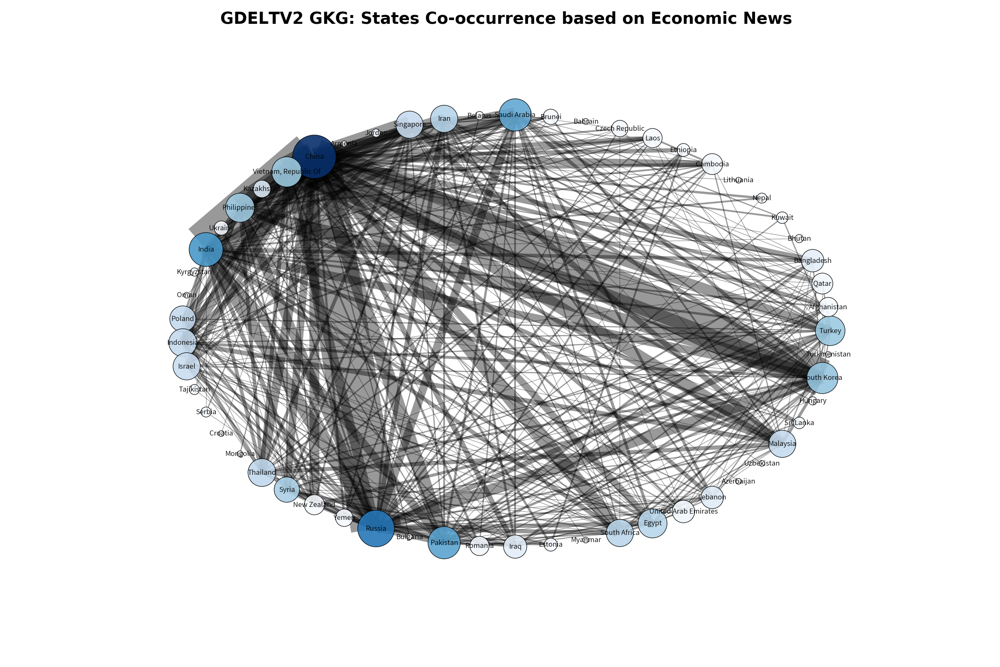

In [33]:
# 从spring layout改为circular layout
g = nx.Graph()
for r in network.values:
    g.add_edge(r[0], r[1], weight=r[2]/40)

plt.figure(figsize=(30, 20))
plt.title('GDELTV2 GKG: States Co-occurrence based on Economic News', 
          y = 0.97, 
          fontsize = 28, 
          fontweight = 'bold')
cf = plt.gcf()
ax = cf.gca()
ax.set_axis_off()

gmax = max(nx.connected_component_subgraphs(g), key=len)

d = nx.degree(gmax)
b = nx.betweenness_centrality(gmax).items()

# 使用spring layout
pos = nx.circular_layout(gmax)

# 针对边的设置
nx.draw_networkx_edges(gmax, 
                       pos, 
                       nodelist=[v[0] for v in b], 
                       node_size=[d[v[0]]*100 for v in b], 
                       with_labels=False, 
                       alpha=0.4, 
                       node_color = [math.log(1+v[1]*1000) for v in b], 
                       cmap=plt.cm.Blues,
                       width=[gmax[u][v]['weight'] for u,v in gmax.edges()])

# 针对节点的设置
nx.draw_networkx_nodes(gmax, 
                       pos, 
                       nodelist=[v[0] for v in b], 
                       node_size=[d[v[0]]*100 for v in b], 
                       with_labels=True, 
                       alpha=0.9, 
                       node_color = [math.log(1+v[1]*1000) for v in b], 
                       cmap=plt.cm.Blues, 
                       width=[gmax[u][v]['weight'] for u,v in gmax.edges()])

# 针对标签的设置
nx.draw_networkx_labels(gmax, 
                        pos, 
                        nodelist=[v[0] for v in b], 
                        node_size=[d[v[0]]*100 for v in b], 
                        with_labels=True, 
                        node_color = [math.log(1+v[1]*1000) for v in b], 
                        cmap=plt.cm.Blues, 
                        width=[gmax[u][v]['weight'] for u,v in gmax.edges()])